##GO/STOP! - Object Detection 시스템 만들기

개발 환경
<br/>데이터 정보
<br/>데이터 전처리
<br/>Anchor Box
<br/>Data Pipeline
<br/>FPN(Feature Pyramid Network)
<br/>Head
<br/>Backbone
<br/>RetinaNet
<br/>Loss Function
<br/>Inference
<br/>모델 구성
<br/>모델 학습
<br/>모델 평가
<br/>Model Checkpoint
<br/>결론
<br/>참고문헌


#개발 환경

In [ ]:
!pip install keras_retinanet

In [ ]:
import os
import copy

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import HTML

In [ ]:
import cv2
from PIL import Image, ImageDraw
from keras_retinanet.utils.image import read_image_bgr

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

In [ ]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

#데이터 정보

In [ ]:
data_path = '/content/drive/MyDrive/lms/object_detection/data'

In [ ]:
(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    data_dir= data_path,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

[KITTI-360](http://www.cvlibs.net/datasets/kitti/)

KITTI 데이터셋은 자율주행을 위한 데이터셋으로 2D object detection 뿐만 아니라 깊이까지 포함한 3D object detection 라벨 등을 제공한다.

In [ ]:
ds_info_splits = "Train Data Size: " + str(ds_info.splits['train'].num_examples) + \
              "\nValidation Data Size: " + str(ds_info.splits['validation'].num_examples) + \
              "\nTest Data Size: " + str(ds_info.splits['test'].num_examples)

reorderlist = ['name', 'full_name', 'description', 'supervised_keys', 'disable_shuffling', 'homepage',
               'file_format', 'download_size', 'dataset_size', 'features', 'supervised_keys',
               'disable_shuffling', 'splits', 'citation']

ds_info_dict = pd.DataFrame({'tfds.core.DatasetInfo':{'name':ds_info.name, 'full_name':ds_info.full_name,
                                     'description':ds_info.description.replace('resources', 'resources<br/>'),
                                     'supervised_keys':ds_info.supervised_keys, 
                                     'disable_shuffling':ds_info.disable_shuffling, 'homepage':ds_info.homepage, 
                                     'file_format':ds_info.file_format, 'download_size':ds_info.download_size,
                                     'dataset_size':ds_info.dataset_size, 'features':ds_info.features,
                                      'supervised_keys':ds_info.supervised_keys, 'disable_shuffling': ds_info.disable_shuffling,
                                      'splits': ds_info_splits.replace('\n', '<br/>'),  'citation':ds_info.citation.replace('\n', '<br/>')}})
ds_info_df = pd.DataFrame(ds_info_dict)
ds_info_df = ds_info_df.reindex(reorderlist).reset_index()
from pandas import option_context
with option_context('display.max_colwidth', None):
  display(ds_info_df.style.set_properties(**{'text-align': 'center'}))

,index,tfds.core.DatasetInfo
0,name,kitti
1,full_name,kitti/3.2.0
2,description,"Kitti contains a suite of vision tasks built using an autonomous driving platform. The full benchmark contains many tasks such as stereo, optical flow, visual odometry, etc. This dataset contains the object detection dataset, including the monocular images and bounding boxes. The dataset contains 7481 training images annotated with 3D bounding boxes. A full description of the annotations can be found in the readme of the object development kit readme on the Kitti homepage."
3,supervised_keys,None
4,disable_shuffling,False
5,homepage,http://www.cvlibs.net/datasets/kitti/
6,file_format,FileFormat.TFRECORD
7,download_size,11.71 GiB
8,dataset_size,5.27 GiB
9,features,"FeaturesDict({ 'image': Image(shape=(None, None, 3), dtype=tf.uint8), 'image/file_name': Text(shape=(), dtype=tf.string), 'objects': Sequence({ 'alpha': tf.float32, 'bbox': BBoxFeature(shape=(4,), dtype=tf.float32), 'dimensions': Tensor(shape=(3,), dtype=tf.float32), 'location': Tensor(shape=(3,), dtype=tf.float32), 'occluded': ClassLabel(shape=(), dtype=tf.int64, num_classes=4), 'rotation_y': tf.float32, 'truncated': tf.float32, 'type': ClassLabel(shape=(), dtype=tf.int64, num_classes=8), }), })"


<br/><br/>

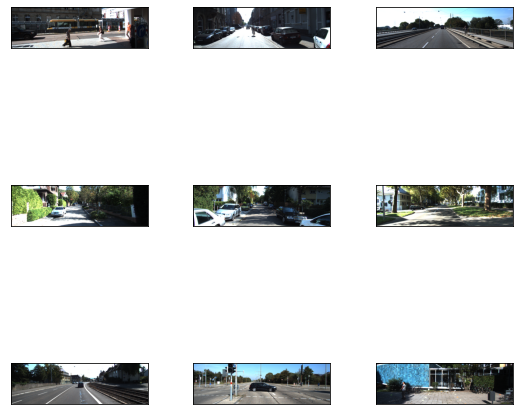

In [ ]:
sample_fig = tfds.show_examples(ds_train, ds_info)

<br/><br/>

In [ ]:
sample = ds_train.take(1)

for example in sample:  
    print('Example')
    print(list(example.keys()))
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print("\n")
print('Objects')
print('alpha\n', objects['alpha'])
print('\nbbox\n', objects['bbox'])
print('\ndimensions\n', objects['dimensions'])
print('\nlocation\n', objects['location'])
print('\noccluded\n', objects['occluded'])
print('\nrotation_y\n', objects['rotation_y'])
print('\ntruncated\n', objects['truncated'])
print('\ntype\n', objects['type'])

Example
['image', 'image/file_name', 'objects']


Objects
alpha
 tf.Tensor([ 2.64 -1.5  -0.06 -0.09 -3.02  0.28], shape=(6,), dtype=float32)

bbox
 tf.Tensor(
[[0.49521622 0.7236601  0.60383785 0.8242892 ]
 [0.4584054  0.42883986 0.5302162  0.45718136]
 [0.4638919  0.5123611  0.5352703  0.5348938 ]
 [0.4618919  0.46965685 0.53437835 0.4914624 ]
 [0.4610811  0.47025326 0.5331081  0.48270425]
 [0.44832432 0.37226307 0.52724326 0.3842892 ]], shape=(6, 4), dtype=float32)

dimensions
 tf.Tensor(
[[1.52 1.76 4.1 ]
 [1.5  1.78 3.69]
 [1.74 0.6  1.79]
 [1.86 0.63 1.82]
 [1.8  0.68 1.44]
 [1.92 0.57 1.32]], shape=(6, 3), dtype=float32)

location
 tf.Tensor(
[[13.68  0.21 28.41]
 [-3.71  1.12 42.37]
 [ 2.42  1.18 47.48]
 [-1.18  1.29 50.02]
 [-1.28  1.28 48.53]
 [-9.38  1.56 47.06]], shape=(6, 3), dtype=float32)

occluded
 tf.Tensor([1 0 0 0 1 1], shape=(6,), dtype=int64)

rotation_y
 tf.Tensor([ 3.08 -1.58 -0.01 -0.11 -3.05  0.09], shape=(6,), dtype=float32)

truncated
 tf.Tensor([0. 0. 0. 0. 0

<br/><br/>

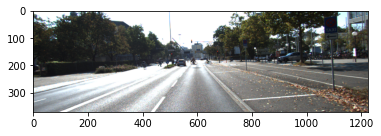

In [ ]:
img = Image.fromarray(image.numpy())
plt.imshow(img)
plt.show()

<br/><br/>

In [ ]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)
    
    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height
    
    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    for _rect in rects:
        draw.rectangle(_rect, outline=(255,0,0), width=2)

    return input_image

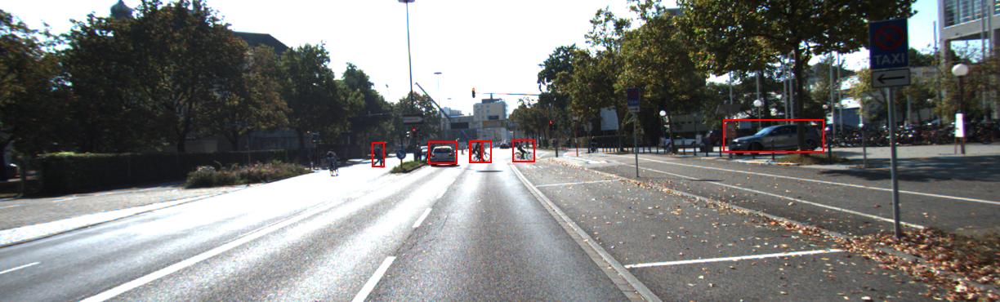

In [ ]:
visualize_bbox(img, objects['bbox'].numpy())

<br/><br/>

#데이터 전처리

KITTI 데이터를 학습에 맞는 형태로 변환한다.
<br/>데이터 파이프라인은 총 4단계로 이루어진다.
1. x와 y좌표 위치 교체 
2. 무작위로 수평 뒤집기(Flip) 
3. 이미지 크기 조정 및 패딩 추가 
4. 좌표계를 [x_min, y_min, x_max, y_max]에서 [x_min, y_min, width, height]으로 수정 

In [ ]:
def swap_xy(boxes):
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)

In [ ]:
def random_flip_horizontal(image, boxes):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack(
           [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )
        
    return image, boxes

In [ ]:
def resize_and_pad_image(image, training=True):

    min_side = 800.0
    max_side = 1333.0
    min_side_range = [640, 1024]
    stride = 128.0
    
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if training:
        min_side = tf.random.uniform((), min_side_range[0], min_side_range[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio

이미지의 비율은 그대로 유지되어야 하고, 이미지의 최대/최소 크기도 제한한다.
<br/>이미지의 크기를 바꾼 후에도 최종적으로 모델에 입력되는 이미지의 크기는 stride 의 배수가 되도록 만든다.

In [ ]:
def convert_to_xywh(boxes):
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )

In [ ]:
def preprocess_data(sample):
    image = sample["image"]
    bbox = swap_xy(sample["objects"]["bbox"])
    class_id = tf.cast(sample["objects"]["type"], dtype=tf.int32)

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id

#Anchor Box

One stage detector에서는 Anchor Box라는 정해져 있는 위치, 크기, 비율 중에 하나로 물체의 위치가 결정된다.
<br/>Anchor Box로 생성되는 것은 물체 위치 후보이다.
<br/>RetinaNet에서는 FPN을 사용하기 때문에 Anchor Box가 더 많이 필요하다.
<br/>FPN의 각 층마다 Anchor Box가 필요하기 때문이다.
<br/>RetinaNet의 FPN에서 pyramid level은 개수가 미리 약속되어 있기 때문에 각 level에서 만들어지는 Anchor Box도 약속되어 있다.

In [ ]:
class AnchorBox:
    def __init__(self):
        self.aspect_ratios = [0.5, 1.0, 2.0]
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]

        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        self._strides = [2 ** i for i in range(3, 8)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)

In [ ]:
def convert_to_corners(boxes):
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

In [ ]:
def compute_iou(boxes1, boxes2):
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

데이터 원본의 bbox는 주관식 정답이라고 생각하면 된다.
<br/>하지만 모델은 객관식으로 문제를 풀어야 하기 때문에 
<br/>주관식 정답을 가장 가까운 객관식 정답으로 바꿔줘야 모델을 학습시킬 수 있다.
<br/>IoU가 높은지 낮은지에 따라 Anchor Box가 정답인지 오답인지 판단한다.

In [ ]:
class LabelEncoder:

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)
        positive_mask = tf.greater_equal(max_iou, match_iou)
        negative_mask = tf.less(max_iou, ignore_iou)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        return batch_images, labels.stack()

실제 라벨을 Anchor Box에 맞춰주는 클래스이다.
<br/>compute_iou 함수를 이용해서 IoU를 구하고 그 IoU를 기준으로 물체에 해당하는 Anchor Box와 배경이 되는 Anchor Box를 지정한다.
<br/>그 Anchor Box와 실제 Bounding Box의 미세한 차이를 계산한다.
<br/>상하좌우의 차이, 로그를 사용한 가로세로 크기를 기록한다. 
<br/>이 과정은 마치 데이터를 훈련이 가능한 형식으로 encode하는 것 같으니 LabelEncoder라는 이름으로 클래스를 만든다.
<br/>IoU가 0.5보다 높으면 물체, 0.4보다 낮으면 배경이다.

#Data Pipeline

In [ ]:
num_classes = 8
batch_size = 2

label_encoder = LabelEncoder()
(train_dataset, val_dataset), dataset_info = tfds.load(
    "kitti", split=["train", "validation"], with_info=True, data_dir=data_path
)

autotune = tf.data.AUTOTUNE
train_dataset = train_dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.prefetch(autotune)

val_dataset = val_dataset.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
val_dataset = val_dataset.map(label_encoder.encode_batch, num_parallel_calls=autotune)
val_dataset = val_dataset.prefetch(autotune)

#FPN(Feature Pyramid Network) 

In [ ]:
class FeaturePyramid(tf.keras.layers.Layer):

    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid")
        self.backbone = backbone
        self.conv_c3_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = tf.keras.layers.UpSampling2D(2)

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output

FPN은 특성을 피라미드처럼 쌓아서 사용하는 방식이다.

#Head

In [ ]:
def build_head(output_filters, bias_init):
    head = tf.keras.Sequential([tf.keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            tf.keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(tf.keras.layers.ReLU())
    head.add(
        tf.keras.layers.Conv2D(
            output_filters,
            3,
            1,
            padding="same",
            kernel_initializer=kernel_init,
            bias_initializer=bias_init,
        )
    )
    return head

Object Detection의 라벨은 class와 box로 이루어지므로 각각을 추론하는 부분이 필요하다. 
<br/>그것을 head라고 부른다.
<br/>Backbone에 해당하는 네트워크와 FPN을 통해 pyramid layer가 추출되고 나면
<br/>그 feature들을 바탕으로 class를 예상하고 box도 예상한다.
<br/>class와 box가 모두 맞을 수도, class와 box 중 하나만 맞을 수도, 둘 다 틀릴 수도 있다.
<br/>class를 예측하는 head와 box를 예측하는 head가 별도로 존재한다는 것이 중요하다. 
<br/>그래서 각각의 head를 만든다.
<br/>head 부분은 유사한 형태로 만들 수 있으니 build_head 라는 함수를 만들고 두 번 호출한다.


#Backbone

In [ ]:
def get_backbone():
    backbone = tf.keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return tf.keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )

RetinaNet의 Backbone은 ResNet50이다.
<br/>FPN에 이용할 수 있도록 중간 레이어도 Output으로 연결한다.

#RetinaNet

In [ ]:
class RetinaNet(tf.keras.Model):

    def __init__(self, num_classes, backbone):
        super(RetinaNet, self).__init__(name="RetinaNet")
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)

RetinaNet은 Backbone + FPN + classification용 head + box용 head이다.

#Loss Function

In [ ]:
class RetinaNetBoxLoss(tf.losses.Loss):

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)

In [ ]:
class RetinaNetClassificationLoss(tf.losses.Loss):

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)

In [ ]:
class RetinaNetLoss(tf.losses.Loss):

    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss

Smooth L1 Loss을 사용하는 Box Regression에는 delta 를 기준으로 계산이 달라지고 <br/>Focal Loss를 사용하는 Classification에서는 alpha 와 gamma 를 사용해서 물체일 때와 배경일 때의 식이 달라지는 점에 주의한다.

#Inference

In [ ]:
class DecodePredictions(tf.keras.layers.Layer):

    def __init__(
        self,
        num_classes=8,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=100,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2]
    ):
        super(DecodePredictions, self).__init__()
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            box_variance, dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        cls_predictions = tf.nn.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )

논문에서는 1000개의 후보(max_detections_per_class=1000)를 골라 처리했지만 
<br/>여기서는 100개(max_detections_per_class=100)의 후보만 골라 처리한다.
<br/>나머지 설정은 논문과 동일하게 한다.
<br/>NMS(Non-Max Suppression)은 직접 구현하지 않고 주어진 tf.image.combined_non_max_suppression 를 사용했다.

In [ ]:
def visualize_detections(
    image, boxes, classes, scores, figsize=(12, 3), linewidth=1, color=[0, 1, 0]
):
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)

        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        pointy = image.shape[0] - h - y1

        patch = plt.Rectangle(
            [x1, pointy], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            x1,
            y1,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()
    return ax

In [ ]:
def prepare_image(image):
    image, _, ratio = resize_and_pad_image(image, training=False)
    image = tf.keras.applications.resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0), ratio

In [ ]:
def get_images(path, type):
    import glob
    if not os.path.exists(path):
        print('Path Directory Error')
        return None
    else:
        images = glob.glob(path + "/*."+type)
    return images

In [ ]:
def self_drive_assist(img_path, size_limit=300):
    image = read_image_bgr(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = tf.cast(image, dtype=tf.float32)
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    class_names = [
                    int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
        ]

    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
    )
    count=0

    for i in class_names: 
        #print(count)
        if "Pedestrian" in class_names:
            return "Stop"

    box = detections.nmsed_boxes[0][:num_detections] / ratio
    
    for i in box:
        x1, y1, x2, y2 = i
        w, h = x2 - x1, y2 - y1
        if w.numpy() >= 300 or h.numpy() >= 300:
            return "Stop"    
    return "Go"
#print(self_drive_assist(images))

#모델 구성

In [ ]:
num_classes = 8
batch_size = 2

resnet50_backbone = get_backbone()
loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes, resnet50_backbone)

In [ ]:
learning_rates = [2.5e-06, 0.000625, 0.00125, 0.0025, 0.00025, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates
)
optimizer = tf.optimizers.SGD(learning_rate=learning_rate_fn, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer)

In [ ]:
model.summary()

Model: "RetinaNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 FeaturePyramid (FeaturePyra  multiple                 31585152  
 mid)                                                            
                                                                 
 sequential_4 (Sequential)   (None, None, None, 72)    2526280   
                                                                 
 sequential_5 (Sequential)   (None, None, None, 36)    2443300   
                                                                 
Total params: 36,554,732
Trainable params: 36,501,612
Non-trainable params: 53,120
_________________________________________________________________


<br/>

#모델 학습

In [ ]:
epochs = 5

with tf.device('/device:GPU:0'):
  model.fit(train_dataset, validation_data=val_dataset, epochs=epochs)

Epoch 1/5
3173/3173 [==============================] - 959s 281ms/step - loss: 2.3746 - val_loss: 1.6916
Epoch 2/5
3173/3173 [==============================] - 897s 282ms/step - loss: 1.0361 - val_loss: 1.2830
Epoch 3/5
3173/3173 [==============================] - 888s 279ms/step - loss: 0.7528 - val_loss: 1.1103
Epoch 4/5
3173/3173 [==============================] - 882s 277ms/step - loss: 0.6007 - val_loss: 1.0519
Epoch 5/5
3173/3173 [==============================] - 882s 277ms/step - loss: 0.4995 - val_loss: 1.0078


<br/><br/>

In [ ]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model(image, training=False)
detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

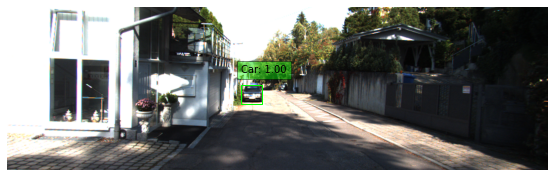

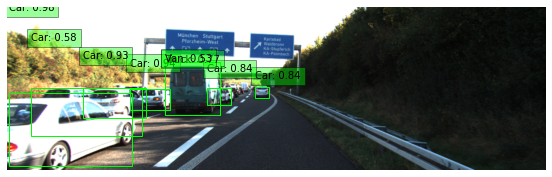

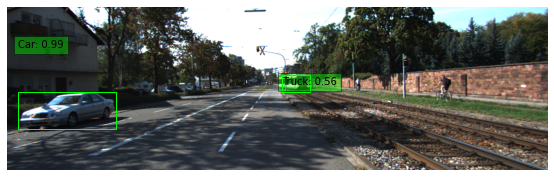

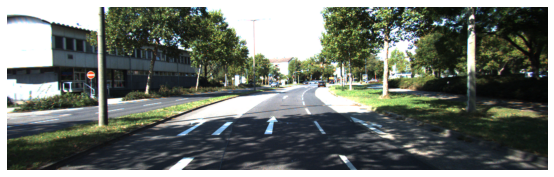

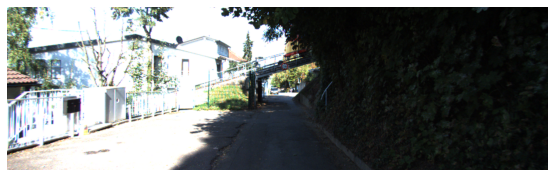

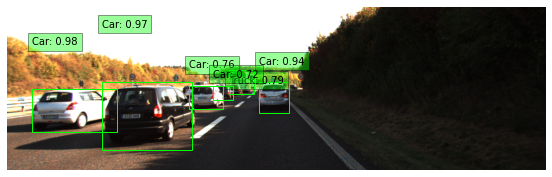

In [ ]:
test_dataset = tfds.load("kitti", split="test", data_dir=data_path)
int2str = dataset_info.features["objects"]["type"].int2str

for sample in test_dataset.take(6):
    image = tf.cast(sample["image"], dtype=tf.float32)
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    class_names = [
        int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
    )

<br/><br/>

In [ ]:
test_img_path = '/content/drive/MyDrive/lms/object_detection/test'
test_img = get_images(test_img_path, 'png')
print(test_img)

['/content/drive/MyDrive/lms/object_detection/test/go_1.png', '/content/drive/MyDrive/lms/object_detection/test/stop_2.png', '/content/drive/MyDrive/lms/object_detection/test/stop_1.png', '/content/drive/MyDrive/lms/object_detection/test/stop_5.png', '/content/drive/MyDrive/lms/object_detection/test/go_5.png', '/content/drive/MyDrive/lms/object_detection/test/stop_3.png', '/content/drive/MyDrive/lms/object_detection/test/go_4.png', '/content/drive/MyDrive/lms/object_detection/test/stop_4.png', '/content/drive/MyDrive/lms/object_detection/test/go_3.png', '/content/drive/MyDrive/lms/object_detection/test/go_2.png']


[test_set](https://aiffelstaticprd.blob.core.windows.net/media/documents/test_set.zip)

#모델 평가

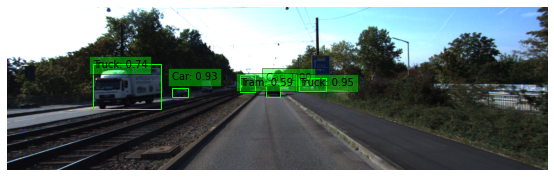

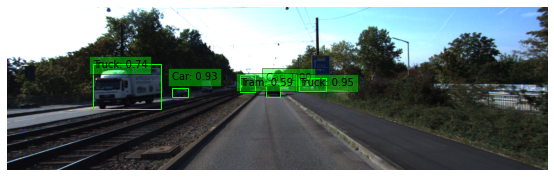

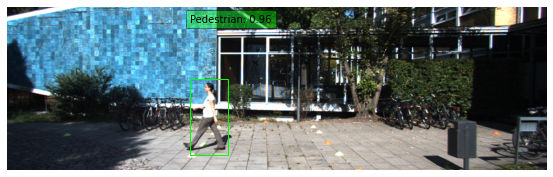

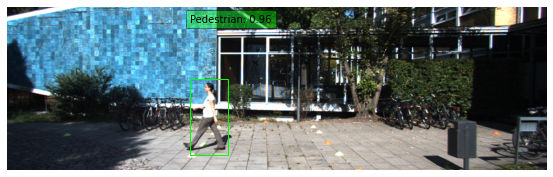

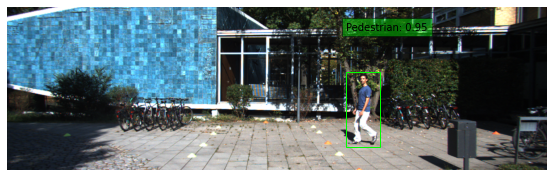

...

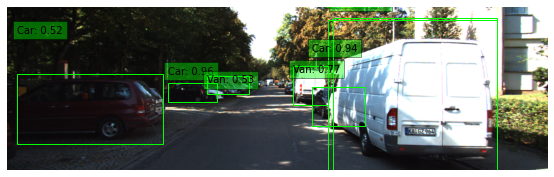

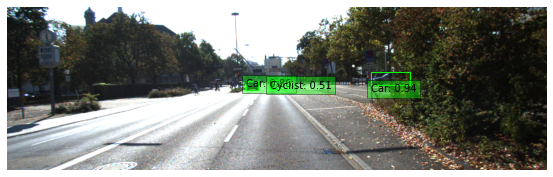

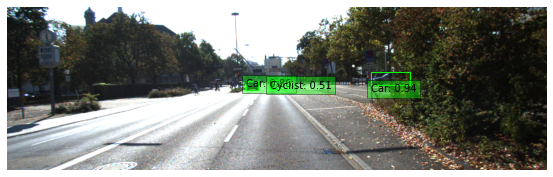

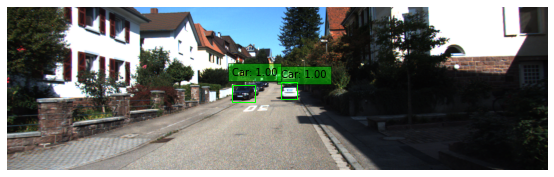

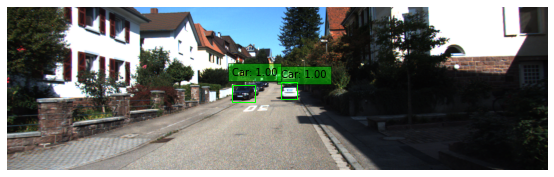

,Real Answer,Predicted Answer,Judgement
0,Go,Go,O
1,Stop,Stop,O
2,Stop,Stop,O
3,Stop,Stop,O
4,Go,Go,O
5,Stop,Go,X
6,Go,Go,O
7,Stop,Stop,O
8,Go,Go,O
9,Go,Go,O





Score: 90


In [ ]:
model_result_df = pd.DataFrame({'Real Answer':['a'], 'Predicted Answer':['a'], 'Judgement':['a']})
index = -1
for i in test_img:
    index += 1
    if 'stop' in i:
      if self_drive_assist(i) == 'Stop':
        model_result_df.loc[index] = ['Stop', self_drive_assist(i), 'O']
      elif self_drive_assist(i) == 'Go':
        model_result_df.loc[index] = ['Stop', self_drive_assist(i), 'X']
    elif 'go' in i:
      if self_drive_assist(i) == 'Go':
        model_result_df.loc[index] = ['Go', self_drive_assist(i), 'O']
      elif self_drive_assist(i) == 'Stop':
        model_result_df.loc[index] = ['Go', self_drive_assist(i), 'X']

model_result_df.to_csv('/content/drive/MyDrive/lms/object_detection/test/model_result.csv', index = False)
print("\n" * 2)
display(model_result_df)
print("\n" * 2)
score = 100 * (len(model_result_df.loc[model_result_df['Judgement'] == 'O']) / len(model_result_df))
print(f"Score: {round(score, 2)}")

<br/><br/>

In [ ]:
def test_system(test_data_path, test_data_answer):
    work_dir = test_data_path
    score = 0
    test_set= test_data_answer
    
    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = self_drive_assist(image_path)
        if pred == answer:
            score += (100 / len(test_data_answer))

    print("\n" * 2)
    print(f"Score: {round(score, 2)}")

In [ ]:
test_data_path = '/content/drive/MyDrive/lms/object_detection/test'
test_data_answer = [("stop_1.png", "Stop"), ("stop_2.png", "Stop"), ("stop_3.png", "Stop"), ("stop_4.png", "Stop"), ("stop_5.png", "Stop"), 
             ("go_1.png", "Go"), ("go_2.png", "Go"), ("go_3.png", "Go"), ("go_4.png", "Go"), ("go_5.png", "Go"),]

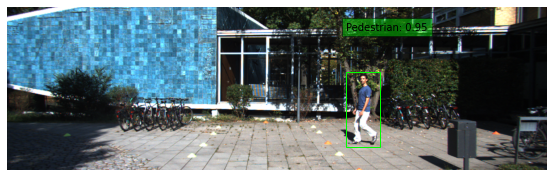

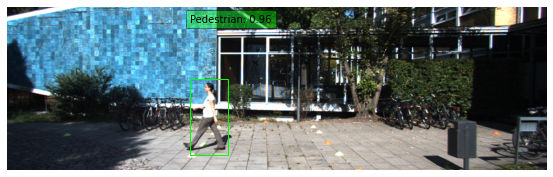

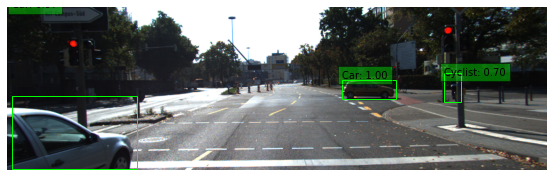

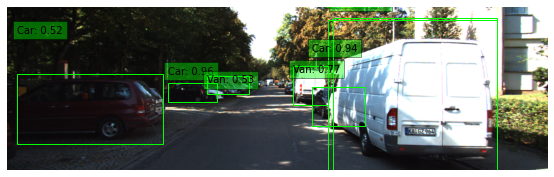

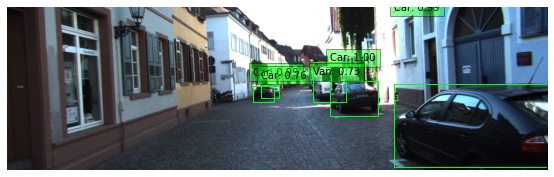

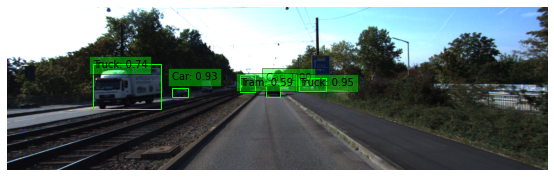

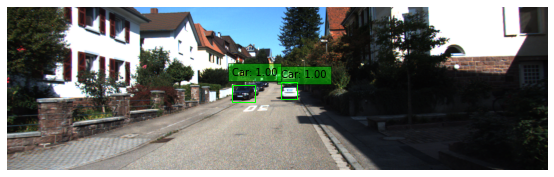

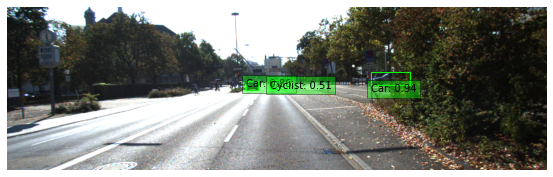

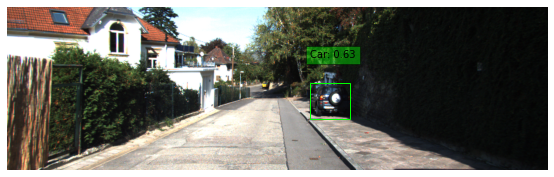

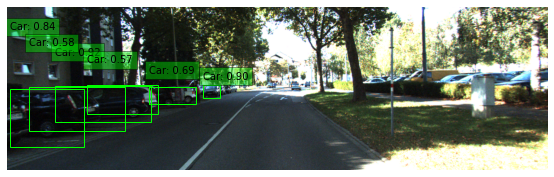




Score: 90


In [ ]:
test_system(test_data_path, test_data_answer)

<br/><br/>

#Model Checkpoint

In [ ]:
epochs = 20

model_dir = "/content/drive/MyDrive/lms/object_detection/model_checkpoint"
callbacks_list = [tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
                                                     monitor="loss", save_best_only=False, save_weights_only=True, verbose=1,)]

model.fit(train_dataset, validation_data=val_dataset,epochs=epochs,callbacks=callbacks_list)

In [ ]:
latest_checkpoint = tf.train.latest_checkpoint(model_dir)
model.load_weights(latest_checkpoint)

<br/><br/>

#참고문헌

**LMS**
<br/>[wer2774](https://github.com/Sangkwun)

<br/>**논문**
<br/>[Tsung-Yi Lin, Priya Goyal, Ross Girshick, Kaiming He, Piotr Dollár, 「Focal Loss for Dense Object Detection」, Facebook AI Research (FAIR), arXiv:1708.02002](https://arxiv.org/abs/1708.02002)
<br/>[Tsung-Yi Lin, Piotr Dollár, Ross Girshick, Kaiming He, Bharath Hariharan, Serge Belongie, 「Feature Pyramid Networks for Object Detection」, Facebook AI Research (FAIR), Cornell University and Cornell Techar, Xiv:1612.03144](https://arxiv.org/abs/1612.03144)

<br/>**공식 사이트**
<br/>cvlib
<br/>[KITTI-360](http://www.cvlibs.net/datasets/kitti/)

<br/>**Github**
<br/>seonghyun97
<br/>[GD-03 Driving.ipynb](https://github.com/seonghyun97/Aiffel_GoingDeeper/blob/master/%5BGD-03%5DDriving.ipynb)

<br/>**웹사이트**
<br/>[test_set](https://aiffelstaticprd.blob.core.windows.net/media/documents/test_set.zip)
<br/>[RetinaNet으로 자율주행 시스템 만들기](https://meissa.tistory.com/76)
